#**Consigna**
###Ejercicio 1: Espacios de Color

Usando una imagen a color de su elección:

a) Cargar la imagen con OpenCV y mostrar los canales BGR por separado.

b) Identificar cuál de los tres canales tiene mayor información basándose en los valores promedio.

c) Convertir la imagen de BGR a RGB y explicar por qué los colores se ven diferentes antes y después de la conversión.

###Ejercicio 2: Muestreo y Cuantización


a) Aplicar muestreo espacial a una imagen con factores de 2, 4 y 8.

b) Para cada caso, calcular:

- El nuevo tamaño de la imagen
- El porcentaje de reducción de datos

c) Aplicar cuantización con 4 niveles diferentes (32, 64, 128, 256)

d) ¿En qué nivel de cuantización comienza a ser visible la degradación de la imagen?

###Ejercicio 3: Segmentación por Color

Dada una imagen con objetos de diferentes colores:

a) Implementar una segmentación para extraer objetos de un color específico usando umbrales en los canales RGB.

b) Calcular y mostrar el histograma de la imagen en escala de grises.

c) Encontrar las coordenadas del rectángulo que encierra el objeto segmentado.

d) Dibujar los bordes del objeto segmentado en color rojo.

In [ ]:
# Instalo y cargo las librerias necesarias
!pip install opencv-python

import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt

#Ejercicio 1: **Espacios de color**

##Carga de Imagen

In [ ]:
!wget -O florero.jpg https://bellavitaflowers.ca/wp-content/uploads/2021/11/Glorious-Gerberas.jpg

--2025-04-13 22:21:04--  https://bellavitaflowers.ca/wp-content/uploads/2021/11/Glorious-Gerberas.jpg
Resolving bellavitaflowers.ca (bellavitaflowers.ca)... 68.178.247.43
Connecting to bellavitaflowers.ca (bellavitaflowers.ca)|68.178.247.43|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 512194 (500K) [image/jpeg]
Saving to: ‘florero.jpg’

florero.jpg         100%[===================>] 500.19K  1.30MB/s    in 0.4s    

2025-04-13 22:21:05 (1.30 MB/s) - ‘florero.jpg’ saved [512194/512194]



## Muestra de Imagen y Canales Individuales

Dimensiones de la imagen: (1000, 750, 3), max:255, min:0

El canal B tiene un promedio de 90.25023733333333, max:230, min:0

El canal G tiene un promedio de 108.70490666666667, max:255, min:0

El canal R tiene un promedio de 122.33695733333333, max:255, min:0


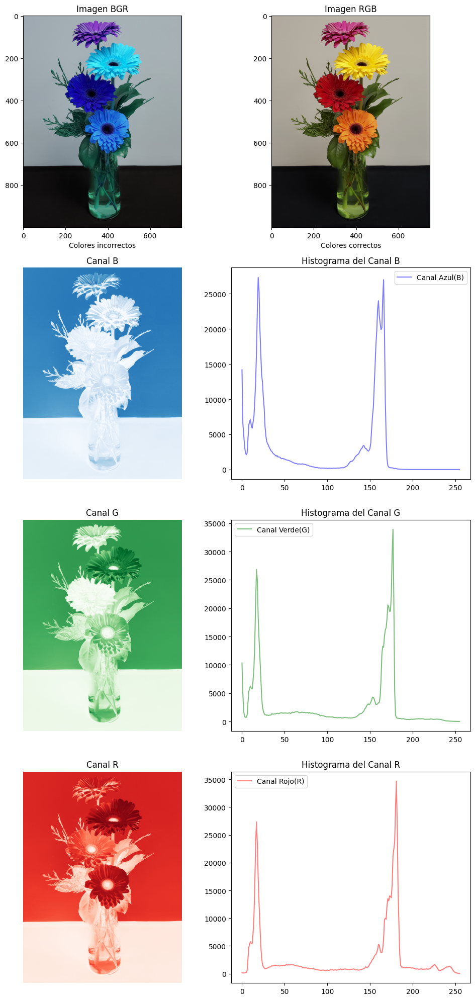

In [ ]:
#Leo la imagen con openCV y muestro la informacion y los canales individuales
imagen=cv2.imread("florero.jpg")

#Convierto a RGB para una correcta visualizacion en pyplot
imagen_rgb=cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)

canal_B=imagen[:,:,0]
canal_G=imagen[:,:,1]
canal_R=imagen[:,:,2]
hist_B,bins_B=np.histogram(canal_B.flatten(),256,[0,256])
hist_G,bins_G=np.histogram(canal_G.flatten(),256,[0,256])
hist_R,bins_R=np.histogram(canal_R.flatten(),256,[0,256])

print(f"Dimensiones de la imagen: {imagen.shape}, max:{np.max(imagen)}, min:{np.min(imagen)}")
print(f"\nEl canal B tiene un promedio de {np.mean(canal_B)}, max:{np.max(canal_B)}, min:{np.min(canal_B)}")
print(f"\nEl canal G tiene un promedio de {np.mean(canal_G)}, max:{np.max(canal_G)}, min:{np.min(canal_G)}")
print(f"\nEl canal R tiene un promedio de {np.mean(canal_R)}, max:{np.max(canal_R)}, min:{np.min(canal_R)}")

fig, axs = plt.subplots(4, 2, figsize=(10, 20))
axs[0,0].imshow(imagen)
axs[0,0].set_title("Imagen BGR")
axs[0,0].set_xlabel("Colores incorrectos")
axs[0,1].imshow(imagen_rgb)
axs[0,1].set_title("Imagen RGB")
axs[0,1].set_xlabel("Colores correctos")
axs[1,0].imshow(canal_B,cmap='Blues')
axs[1,0].set_title("Canal B")
axs[1,0].axis('off')
axs[1,1].plot(bins_B[:-1], hist_B, color='blue', label='Canal Azul(B)', alpha=0.5)
axs[1,1].legend()  # Muestra la leyenda para identificar cada histograma
axs[1,1].set_title("Histograma del Canal B")
axs[2,0].imshow(canal_G,cmap='Greens')
axs[2,0].set_title("Canal G")
axs[2,0].axis('off')
axs[2,1].plot(bins_G[:-1], hist_G, color='green', label='Canal Verde(G)', alpha=0.5)
axs[2,1].legend()  # Muestra la leyenda para identificar cada histograma
axs[2,1].set_title("Histograma del Canal G")
axs[3,0].imshow(canal_R,cmap='Reds')
axs[3,0].set_title("Canal R")
axs[3,0].axis('off')
axs[3,1].plot(bins_R[:-1], hist_R, color='red', label='Canal Rojo(R)', alpha=0.5)
axs[3,1].legend()  # Muestra la leyenda para identificar cada histograma
axs[3,1].set_title("Histograma del Canal R")

plt.tight_layout()
plt.show()




**Observaciones**

Cuando se trata de mostrar la imagen directamente desde openCV sin convertirla a RGB se muestra de forma incorrecta ya que el modo de openCV es BGR e intercambia las posiciones del canal rojo con el canal azul. Esto se corrige aplicando el filtro *cv2.COLOR_BGR2RGB*.


Se observa que el canal con mayor informacion en la imagen es el **Rojo (R)** con una **media de 122** y un **maximo de 255**.

#Ejercicio 2: **Muestreo y Cuantización**

## Definicion de Funciones para el muestreo y la cuantizacion

In [ ]:
#Funcion de muestreo
def muestreo_espacial(imagen, factor_muestreo): #Toma un pixel de cada n pixeles (factor_muestreo)
    filas, columnas, canales = imagen.shape
    # El operador "//" realiza una division entera (devuelve la parte entera del resultado)
    imagen_muestreada = np.zeros((filas // factor_muestreo, columnas // factor_muestreo, canales), dtype=np.uint8)
    for i in range(filas // factor_muestreo):
        for j in range(columnas // factor_muestreo):
            imagen_muestreada[i, j] = imagen[i * factor_muestreo, j * factor_muestreo]
    return imagen_muestreada

#Funcion de cuantizacion canal
def cuantizacion_canal(canal, factor_cuantizacion): #reduce Nº tonos de un canal
  # Divide por factor_cuantizacion, redondea hacia abajo y multiplica por factor_cuantizacion
  canal_cuantizado = np.floor(canal/factor_cuantizacion)*factor_cuantizacion    # Agrupa valores en intervalos de tamaño factor_cuantizacion
  canal_cuantizado = canal_cuantizado.astype(np.uint8)   # Convierte a enteros 0-255
  return canal_cuantizado

def cuantizacion_canal_modificada(canal, factor_cuantizacion): #reduce Nº tonos de un canal
  #uso roun en lugar de floor y resto 1 al factor para evitar el valor 256
  # Divide por factor_cuantizacion, redondea hacia abajo y multiplica por factor_cuantizacion
  for i in range(canal.shape[0]):
        for j in range(canal.shape[1]):
            nuevo_valor = int(np.round(canal[i, j] / factor_cuantizacion) * factor_cuantizacion)
            canal[i, j] = np.clip(nuevo_valor, 0, 255)  # Asegurar que los valores estén en el rango 0-255
  return canal

#Funcion de cuantizacion imagen
def cuantizacion_imagen(imagen, factor_cuantizacion): #reduce Nº tonos de la imagen completa
  canal_0=imagen[:,:,0]
  canal_1=imagen[:,:,1]
  canal_2=imagen[:,:,2]
  canal_0=cuantizacion_canal(canal_0,factor_cuantizacion)
  canal_1=cuantizacion_canal(canal_1,factor_cuantizacion)
  canal_2=cuantizacion_canal(canal_2,factor_cuantizacion)
  imagen_cuantizada=np.dstack((canal_0,canal_1,canal_2))
  return imagen_cuantizada

def cuantizacion_imagen_modificada(imagen, factor_cuantizacion): #reduce Nº tonos de la imagen completa
  canal_0=imagen[:,:,0]
  canal_1=imagen[:,:,1]
  canal_2=imagen[:,:,2]
  canal_0=cuantizacion_canal_modificada(canal_0,factor_cuantizacion)
  canal_1=cuantizacion_canal_modificada(canal_1,factor_cuantizacion)
  canal_2=cuantizacion_canal_modificada(canal_2,factor_cuantizacion)
  imagen_cuantizada=np.dstack((canal_0,canal_1,canal_2))
  return imagen_cuantizada

#Funcion para converir a gris
def convertir_a_gris(imagen): #Convierte a grices con factor de 1/3 (promedio)
  i,j,c=imagen.shape
  imagen_gris=np.zeros((i,j),dtype=np.uint8)
  for x in range(i):
    for y in range(j):
      imagen_gris[x,y]=np.mean(imagen[x,y])
  return imagen_gris

#Para obtener la paleta de colores actual
def obtener_paleta_colores_unica(imagen_rgb):
    # Obtiene todos los colores únicos de la imagen
    colores_unicos = np.unique(imagen_rgb.reshape(-1, 3), axis=0)

    # Ordena los colores únicos por los canales RGB
    colores_unicos = colores_unicos[np.lexsort((colores_unicos[:, 2], colores_unicos[:, 1], colores_unicos[:, 0]))][::-1]

    # Calcula el número de filas y columnas para la paleta
    num_colores = colores_unicos.shape[0]
    num_columnas = min(num_colores, 10)  # Máximo 10 columnas
    num_filas = (num_colores + num_columnas - 1) // num_columnas  # Calcula el número de filas necesario
    if num_filas < 10:
        num_filas = 10
    if num_columnas < 10:
        num_columnas = 10

    # Crea una imagen para la paleta de colores
    ancho_paleta = 5  # Ancho de cada cuadro de color
    alto_paleta = 5  # Alto de cada cuadro de color
    #paleta_imagen = np.zeros((alto_paleta * num_filas, ancho_paleta * num_columnas, 3), dtype=np.uint8)
    paleta_imagen = np.full((alto_paleta * num_filas, ancho_paleta * num_columnas, 3), 255, dtype=np.uint8) #Modifico para que la ausencia de color la muestre en blanco

    # Dibuja los cuadros de color en la paleta
    for i, color in enumerate(colores_unicos):
        fila = i // num_columnas
        columna = i % num_columnas
        paleta_imagen[fila * alto_paleta:(fila + 1) * alto_paleta, columna * ancho_paleta:(columna + 1) * ancho_paleta] = color

    return paleta_imagen



##Muestreos



#####################################################
       Muestreo con factor 2
#####################################################

tamaño original: 1000x750 = 750000 pixeles
tamaño muestreado: 500x375 = 187500 pixeles
porcentaje de reduccion: 75.00%



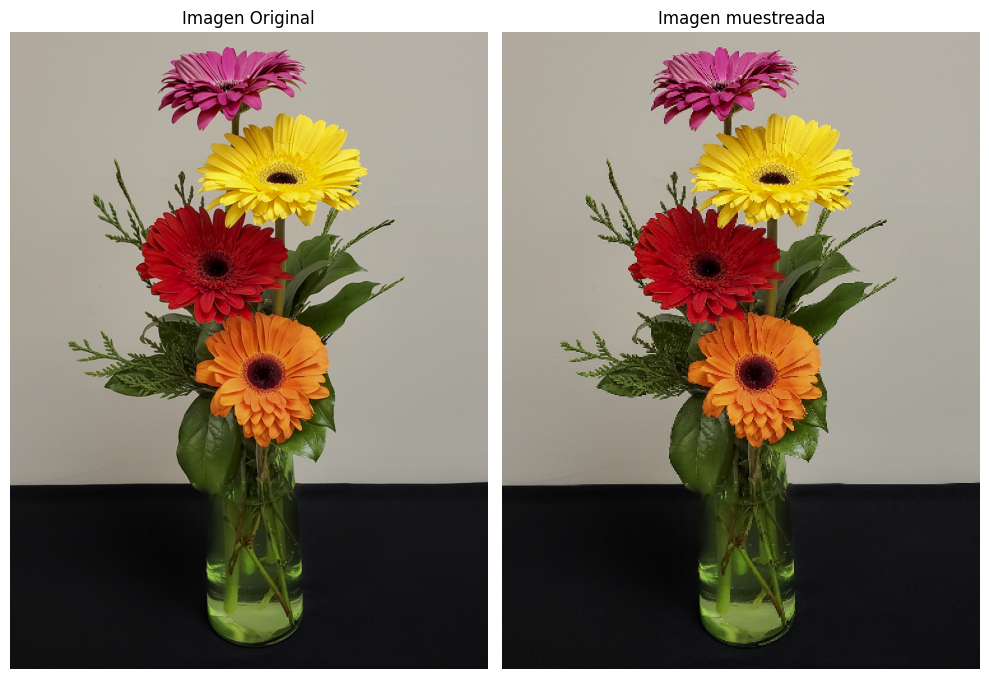



#####################################################
       Muestreo con factor 4
#####################################################

tamaño original: 1000x750 = 750000 pixeles
tamaño muestreado: 250x187 = 46750 pixeles
porcentaje de reduccion: 93.77%



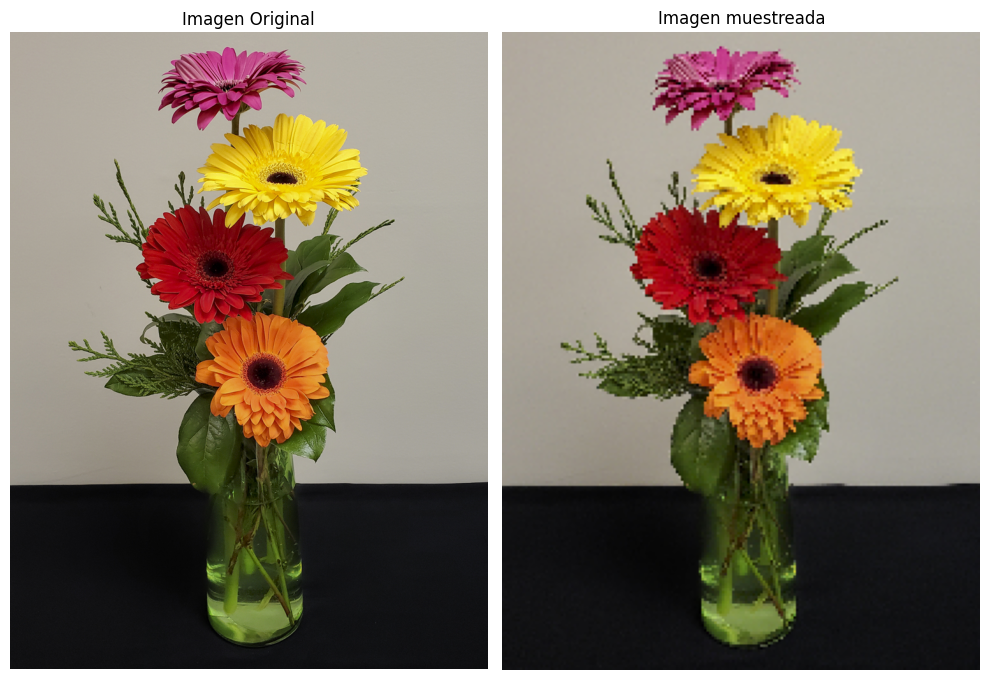



#####################################################
       Muestreo con factor 8
#####################################################

tamaño original: 1000x750 = 750000 pixeles
tamaño muestreado: 125x93 = 11625 pixeles
porcentaje de reduccion: 98.45%



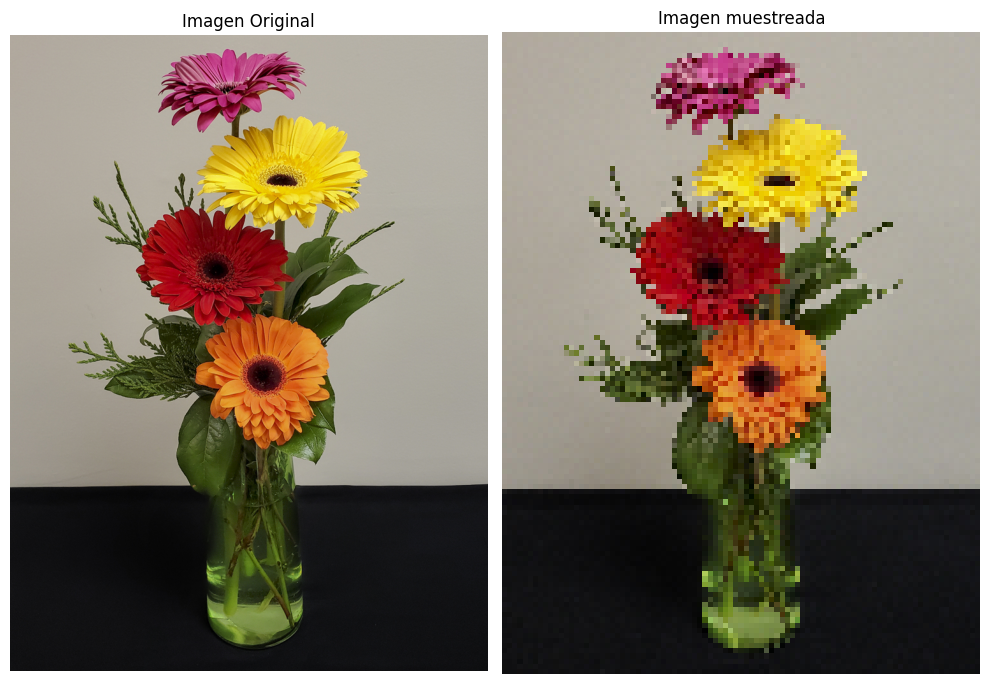

In [ ]:
#Realizo los muestreos por los factores de la lista
lista_muestreos=[2,4,8]
for muestreo in lista_muestreos:
  imagen_muestreada=muestreo_espacial(imagen_rgb,muestreo)
  ancho_original, alto_original = imagen_rgb.shape[:2]
  ancho_muestreado, alto_muestreado = imagen_muestreada.shape[:2]
  porcentaje_reduccion = ((ancho_original * alto_original) - (ancho_muestreado * alto_muestreado)) / (ancho_original * alto_original) * 100

  print("\n\n#####################################################")
  print(f"       Muestreo con factor {muestreo}")
  print("#####################################################\n")

  print(f"tamaño original: {ancho_original}x{alto_original} = {ancho_original*alto_original} pixeles")
  print(f"tamaño muestreado: {ancho_muestreado}x{alto_muestreado} = {ancho_muestreado*alto_muestreado} pixeles")
  print(f"porcentaje de reduccion: {porcentaje_reduccion:.2f}%\n")

  fig, axs = plt.subplots(1, 2, figsize=(10, 15))
  axs[0].imshow(imagen_rgb)
  axs[0].set_title("Imagen Original")
  axs[0].axis('off')
  axs[1].imshow(imagen_muestreada)
  axs[1].set_title("Imagen muestreada")
  axs[1].axis('off')

  plt.tight_layout()
  plt.show()


**Observaciones**

Se observa una reduccion significativa del tamaño sin degradacion de la informacion con  el **factor de muestreo 2**. A partir del **factor de muestreo 4** se comienza a ver pixelado en la imagen, en el **factor de muestreo 8** ya la perdida de informacion  es notable.

##Cuantizaciones



############################################
       Cuantizacion con factor 32
############################################



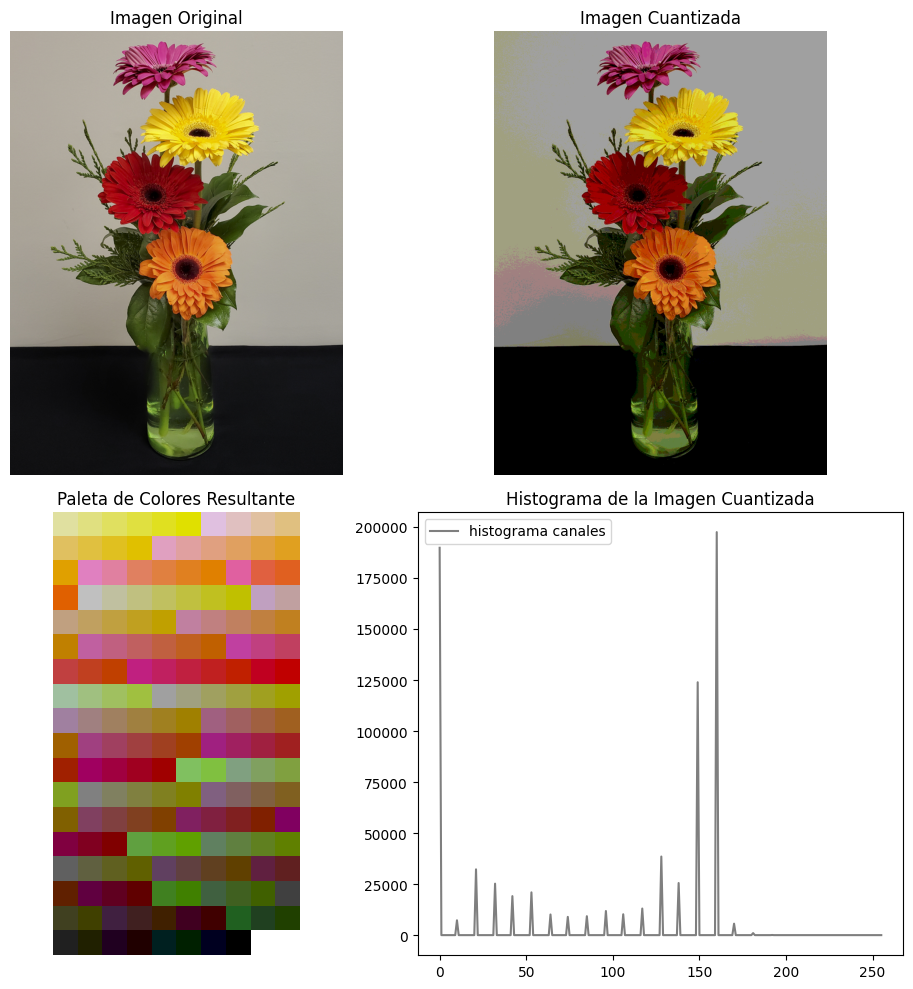



############################################
       Cuantizacion con factor 64
############################################



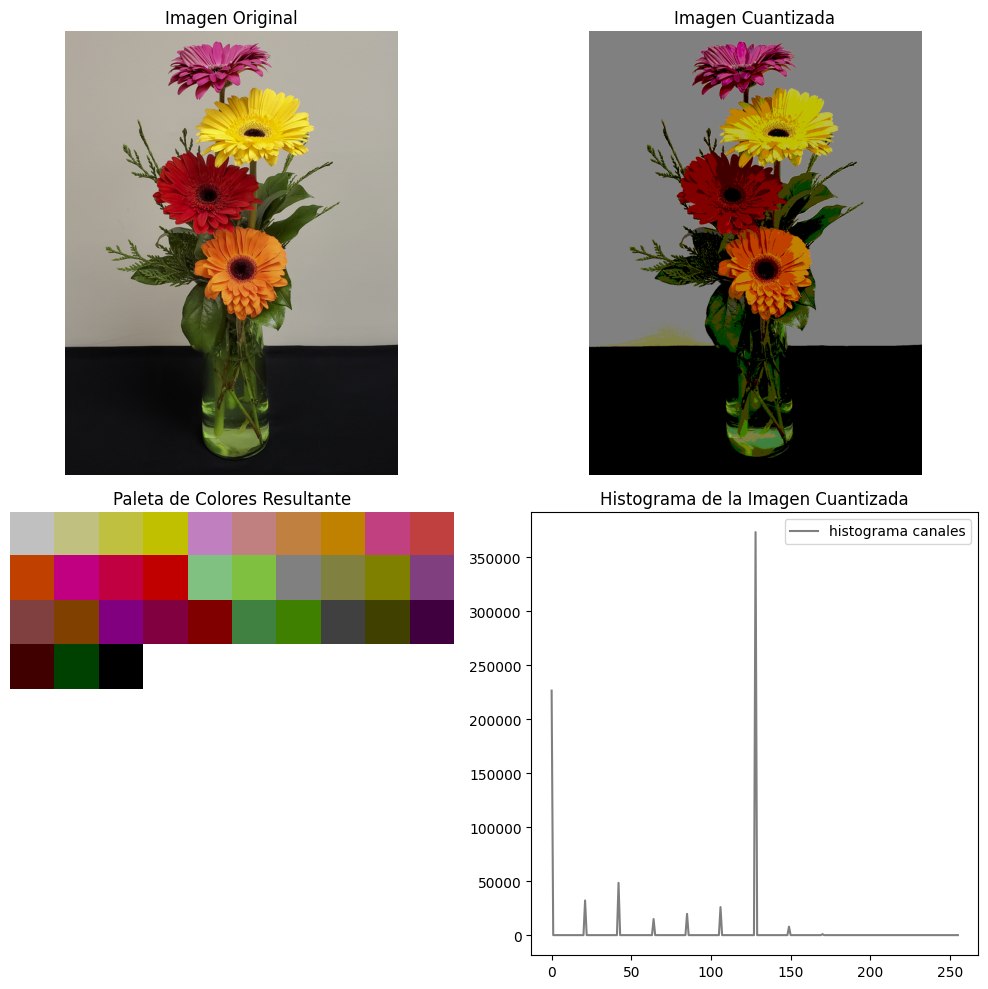



############################################
       Cuantizacion con factor 128
############################################



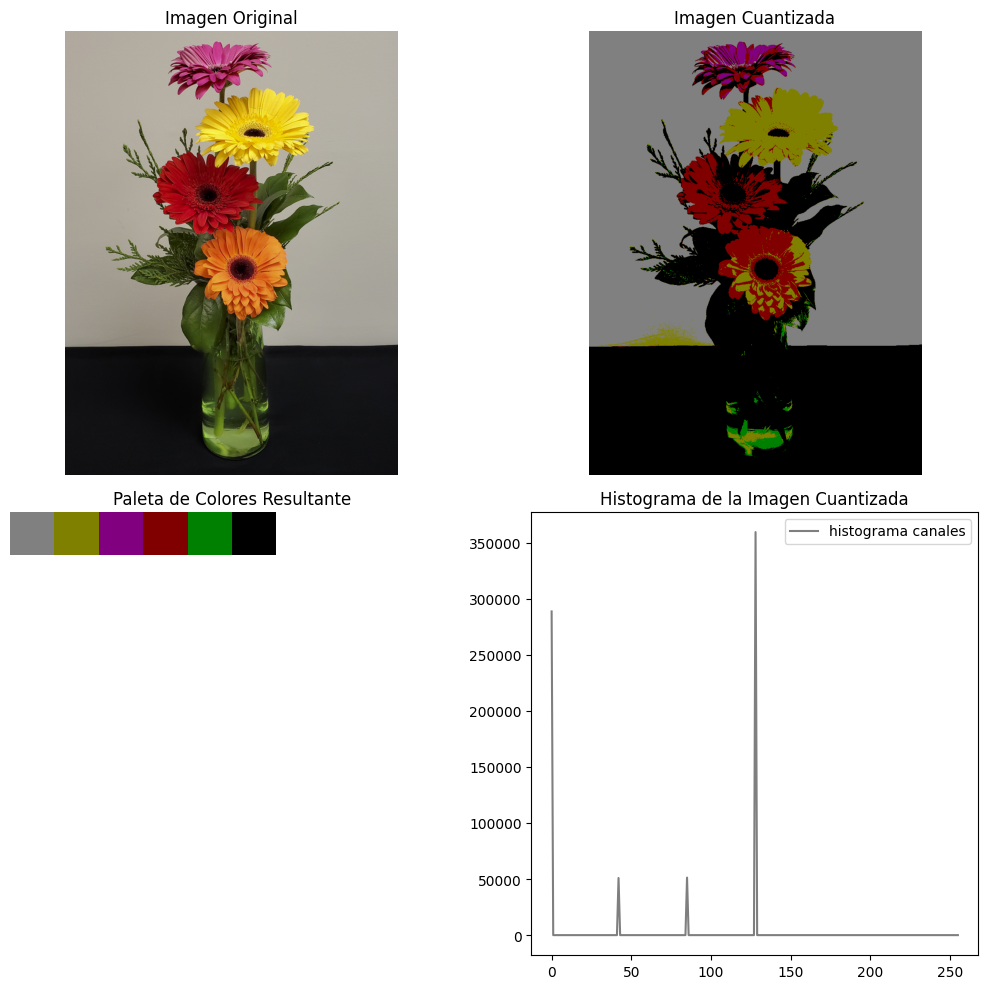



############################################
       Cuantizacion con factor 256
############################################



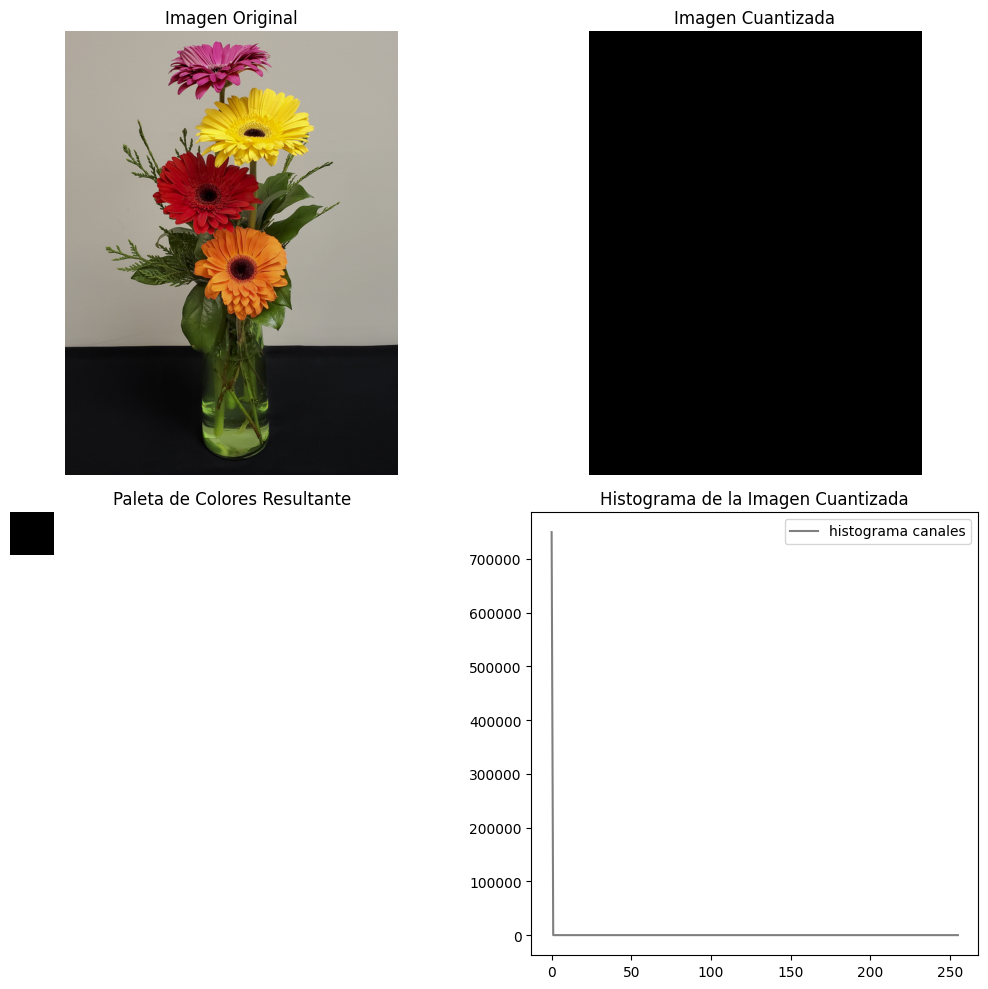

In [ ]:
#Realizao las cuantizaciones por los factores de la lista
lista_cuantizaciones=[32,64,128,256]
for cuantizacion in lista_cuantizaciones:
  imagen_cuantizada=cuantizacion_imagen(imagen_rgb.copy(),cuantizacion)

  print("\n\n############################################")
  print(f"       Cuantizacion con factor {cuantizacion}")
  print("############################################\n")
  imagen_cuantizada_gris=convertir_a_gris(imagen_cuantizada.copy())
  hist_cuantizada,bins_cuantizada=np.histogram(imagen_cuantizada_gris.flatten(),256,[0,256])
  paleta_colores=obtener_paleta_colores_unica(imagen_cuantizada)
  fig, axs = plt.subplots(2, 2, figsize=(10,10))
  axs[0,0].imshow(imagen_rgb)
  axs[0,0].set_title("Imagen Original")
  axs[0,0].axis('off')
  axs[0,1].imshow(imagen_cuantizada)
  axs[0,1].set_title("Imagen Cuantizada")
  axs[0,1].axis('off')
  axs[1,0].imshow(paleta_colores)
  axs[1,0].set_title("Paleta de Colores Resultante")
  axs[1,0].axis('off')
  axs[1,1].plot(bins_cuantizada[:-1], hist_cuantizada, color='black', label='histograma canales', alpha=0.5)
  axs[1,1].legend()  # Muestra la leyenda para identificar cada histograma
  axs[1,1].set_title("Histograma de la Imagen Cuantizada")

  plt.tight_layout()
  plt.show()


**Observaciones**

Se observa una leve degradacion a partir del **factor de cuantización 64** con 33 colores que se hace mucho mas proncunciado en el **factor 128** en el que la paleta resultante se reduce a 6 colores.

Tambien es observable que el la paleta resultante con el **factor de cuantización 256** se reduce a un solo color, en este caso negro por lo que muestra una mimagen totalmente en ese color.
- **Hipótesis:** tiende al color negro ya que redondea hacia abajo antes de la multiplicacion. Voy a probar modificar la funcion utilizando round y luego de multiplicar por el factor de forma individual en cada pixel. Para ello creo una funcion alternativa de cuantizacion por canal



############################################
       Cuantizacion con factor 32
############################################



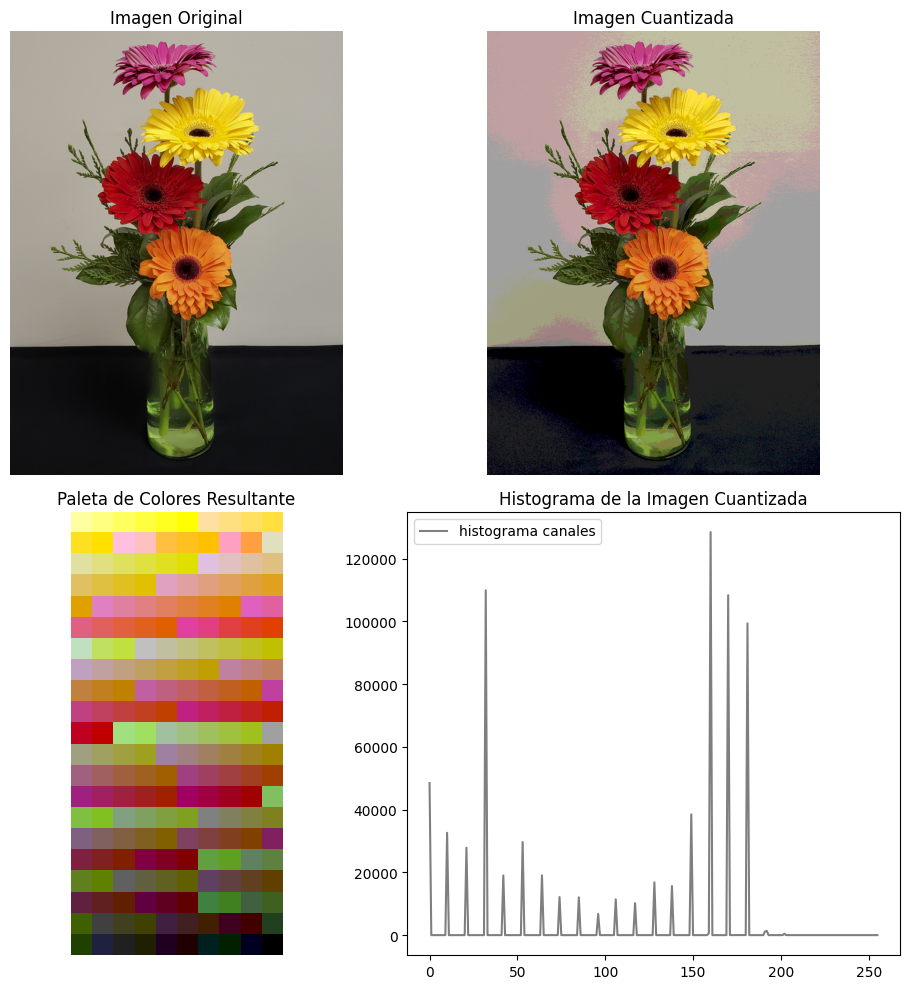



############################################
       Cuantizacion con factor 64
############################################



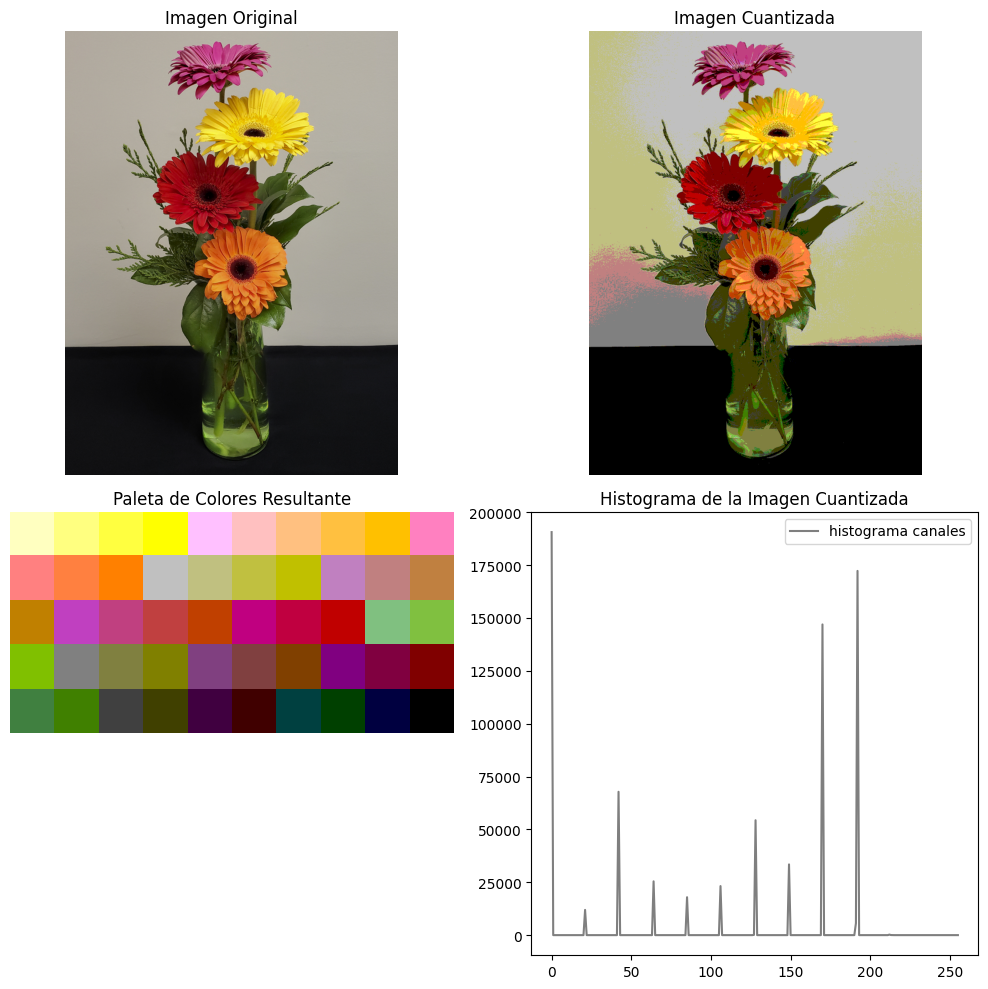



############################################
       Cuantizacion con factor 128
############################################



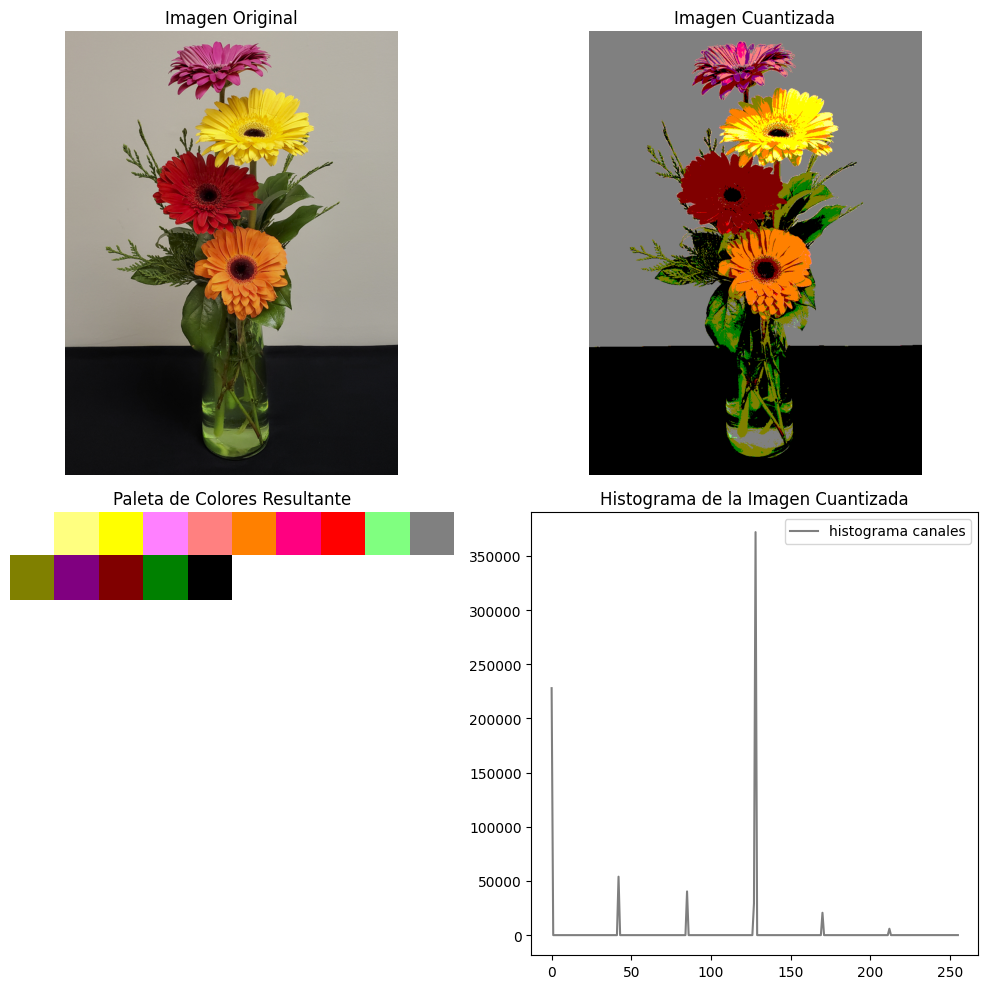



############################################
       Cuantizacion con factor 256
############################################



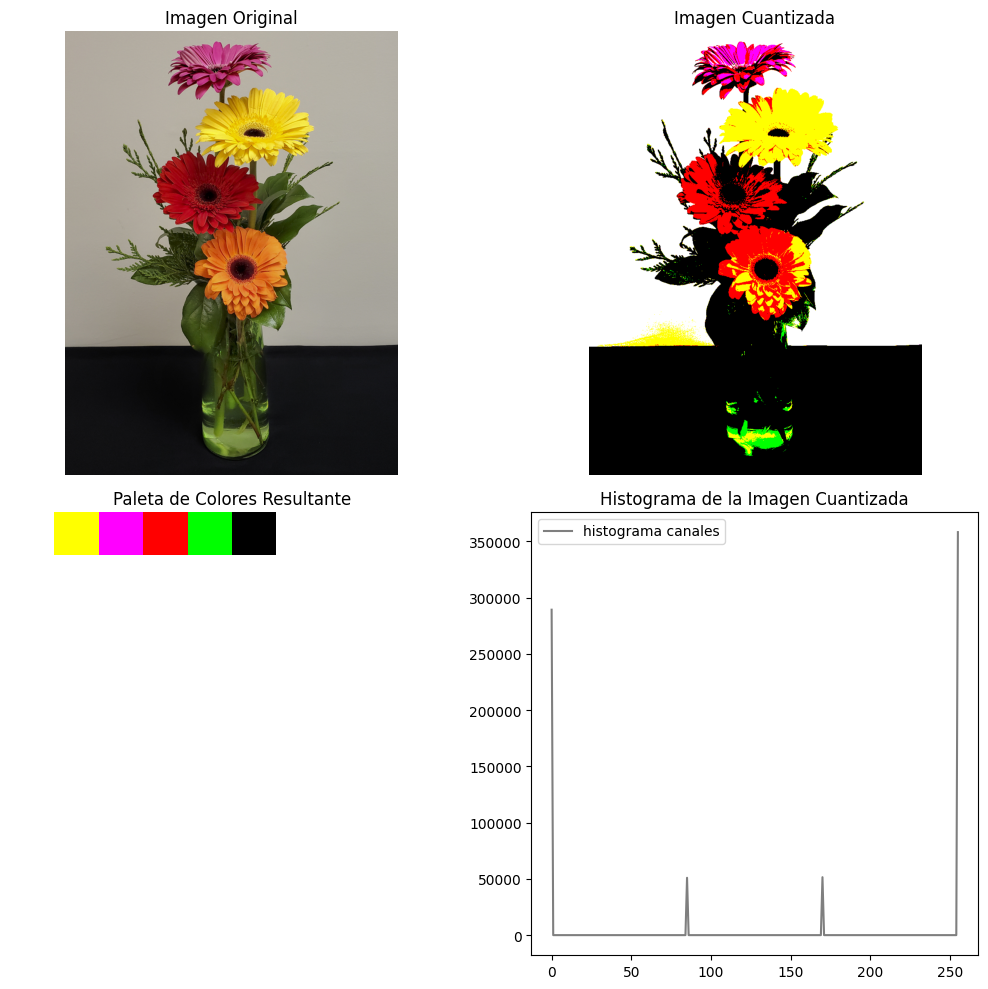

In [ ]:
#Realizao las cuantizaciones por los factores de la lista con la funcion alternativa
lista_cuantizaciones=[32,64,128,256]
for cuantizacion in lista_cuantizaciones:
  imagen_cuantizada=cuantizacion_imagen_modificada(imagen_rgb.copy(),cuantizacion)

  print("\n\n############################################")
  print(f"       Cuantizacion con factor {cuantizacion}")
  print("############################################\n")
  imagen_cuantizada_gris=convertir_a_gris(imagen_cuantizada.copy())
  hist_cuantizada,bins_cuantizada=np.histogram(imagen_cuantizada_gris.flatten(),256,[0,256])
  paleta_colores=obtener_paleta_colores_unica(imagen_cuantizada)
  fig, axs = plt.subplots(2, 2, figsize=(10,10))
  axs[0,0].imshow(imagen_rgb)
  axs[0,0].set_title("Imagen Original")
  axs[0,0].axis('off')
  axs[0,1].imshow(imagen_cuantizada)
  axs[0,1].set_title("Imagen Cuantizada")
  axs[0,1].axis('off')
  axs[1,0].imshow(paleta_colores)
  axs[1,0].set_title("Paleta de Colores Resultante")
  axs[1,0].axis('off')
  axs[1,1].plot(bins_cuantizada[:-1], hist_cuantizada, color='black', label='histograma canales', alpha=0.5)
  axs[1,1].legend()  # Muestra la leyenda para identificar cada histograma
  axs[1,1].set_title("Histograma de la Imagen Cuantizada")

  plt.tight_layout()
  plt.show()



**Comprobacion de la hipótesis**

Al aplicar la funcion modificada se obtiene una nueva gama de colores donde se incluye el blanco y tiende a colores mas claros que con la funcion original. La degradacion es menos marcada que en el original aunque comienza a mostrarse en el mismo punto.

#Ejercicio 3: **Segmentación por color**

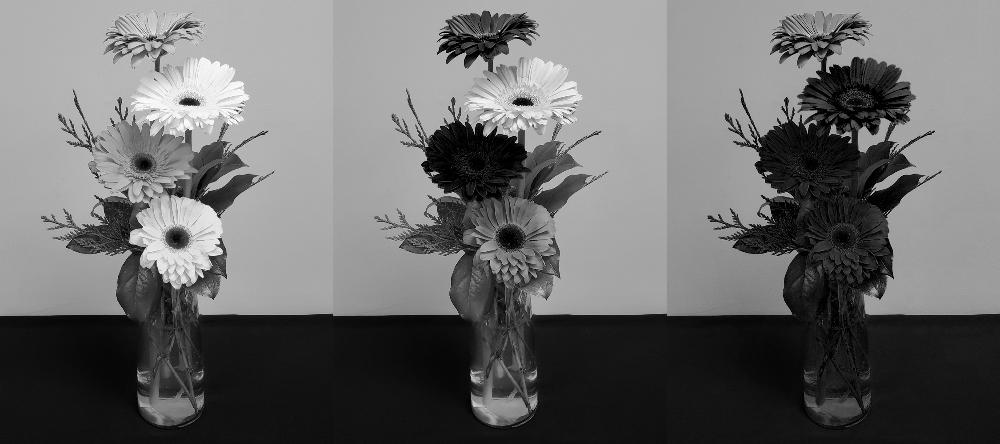

In [ ]:
# Separación de canales de color
rojo = imagen_rgb[:,:,0]
verde = imagen_rgb[:,:,1]
azul = imagen_rgb[:,:,2]
canales = np.concatenate((rojo,verde,azul),axis=1)
cv2_imshow(canales)

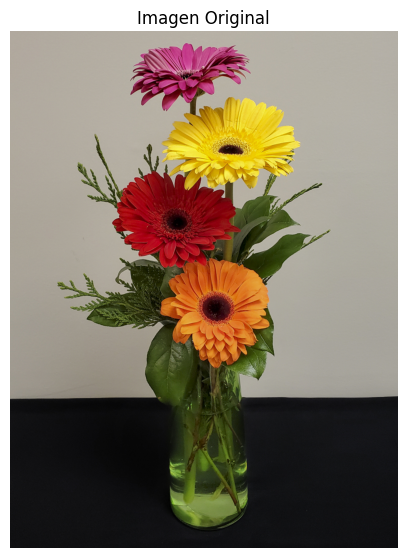

In [ ]:
#Muestro nuevamente la imagen original
plt.figure(figsize=(5, 10))
plt.imshow(imagen_rgb)
plt.title("Imagen Original")
plt.axis('off')
plt.show()

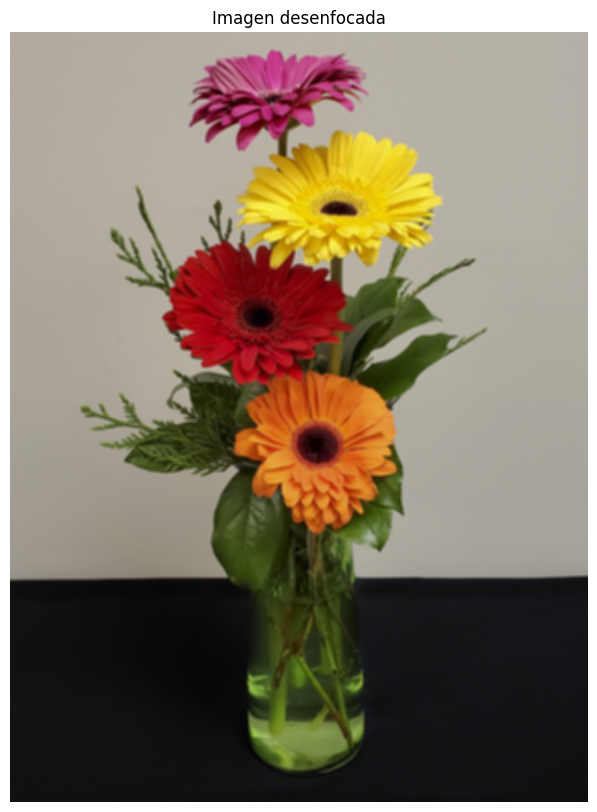

In [ ]:
#Aplico desenfoque gausiano para facilitar la segmentacion
imagen_rgb_blur = cv2.GaussianBlur(imagen_rgb, (5, 5), 5)
rojo = imagen_rgb_blur[:,:,0]
verde = imagen_rgb_blur[:,:,1]
azul = imagen_rgb_blur[:,:,2]
plt.figure(figsize=(10,10))
plt.imshow(imagen_rgb_blur)
plt.title("Imagen desenfocada")
plt.axis('off')
plt.show()

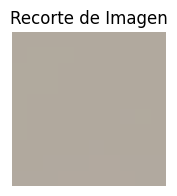

minimo rojo: 177, maximo rojo: 178
minimo verde: 169, maximo verde: 170
minimo azul: 158, maximo azul: 159


In [ ]:
#Recorto una porcion de imagen para ver el color del fondo
recorte=imagen_rgb_blur[10:20,10:20,:]
plt.figure(figsize=(2, 2))
plt.imshow(recorte)
plt.title("Recorte de Imagen")
plt.axis('off')
plt.show()
#muestro minimos y maximos por canal del fondo
print(f"minimo rojo: {np.min(recorte[:,:,0])}, maximo rojo: {np.max(recorte[:,:,0])}")
print(f"minimo verde: {np.min(recorte[:,:,1])}, maximo verde: {np.max(recorte[:,:,1])}")
print(f"minimo azul: {np.min(recorte[:,:,2])}, maximo azul: {np.max(recorte[:,:,2])}")


##Segmentacion flor amarilla

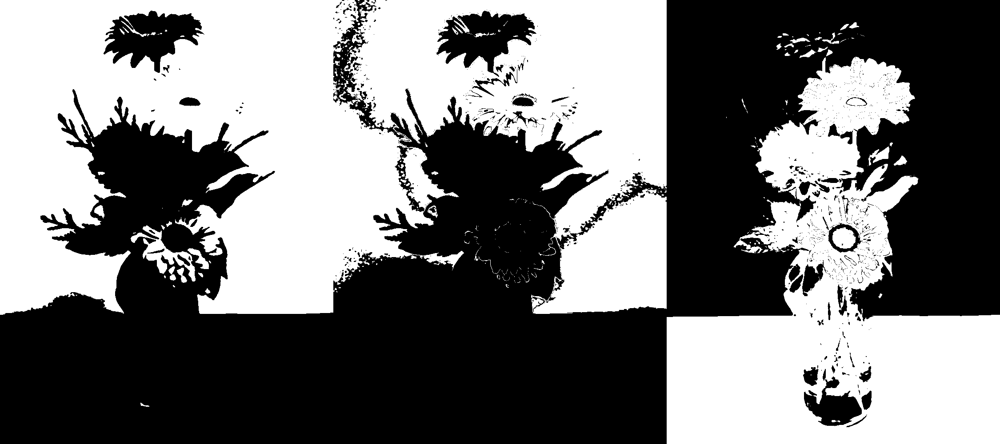

In [ ]:
# Segmentación de la flor amarilla
seg_r = (rojo>150) & (verde>110)
seg_v = ((verde>170) & (rojo >170)) | ((verde>100) & (verde<170) & ((rojo>160) & (rojo<200)))
seg_a = (azul<30) | ((azul>30) & (rojo>150) & (verde>100)) & ((azul<90) | (azul>170)) #Ajus&o para mejorar la deteccion

seg_rgb = np.concatenate((seg_r,seg_v,seg_a),axis=1)
cv2_imshow(seg_rgb*255)

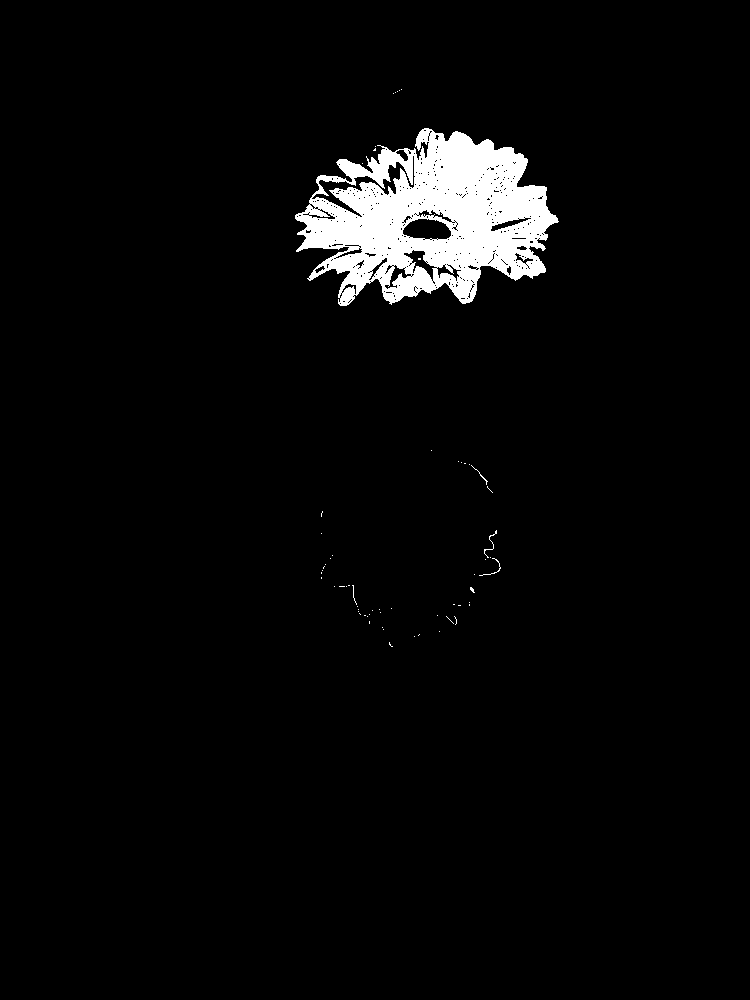

In [ ]:
#Muestra el resultado de la mulktiplicacion logica
seg_rv = np.logical_and(seg_r,seg_v)
seg = np.logical_and(seg_rv,seg_a)
cv2_imshow(seg*255)

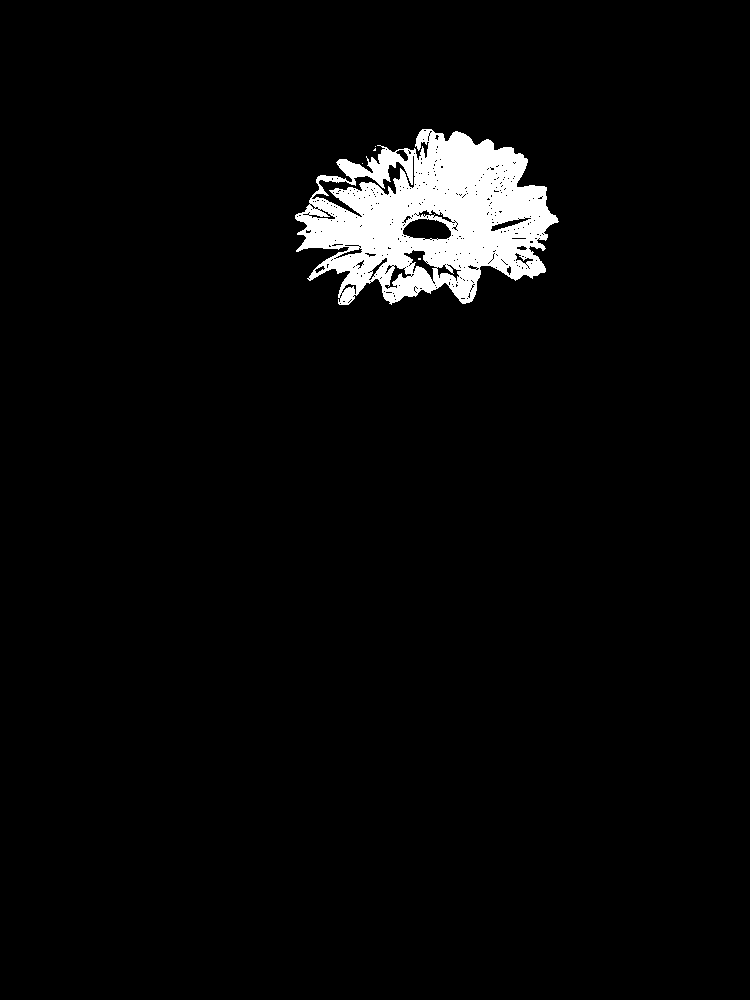

In [ ]:
# Eliminación horizontal de píxeles aislados
(N,M) = seg.shape
limpia = seg.copy()
for i in range(N):
    s = np.sum(seg[i,:])
    if s<10:
        limpia[i,:] = 0
cv2_imshow(limpia*255)

(1000, 750)


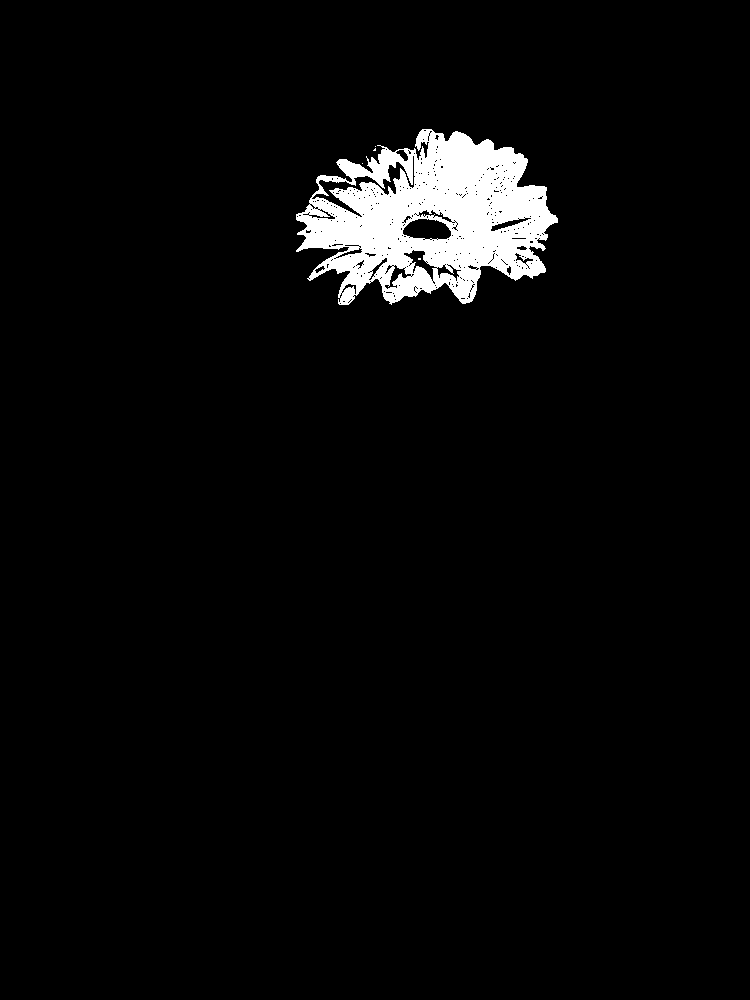

In [ ]:
# Eliminación vertical de píxeles aislados
(N,M) = seg.shape
print(limpia.shape)
limpia = limpia.copy()
for i in range(M):
    s = np.sum(limpia[:,i])
    if s<5:
        limpia[:,i] = 0
cv2_imshow(limpia*255)

##Conversion a escala de grises

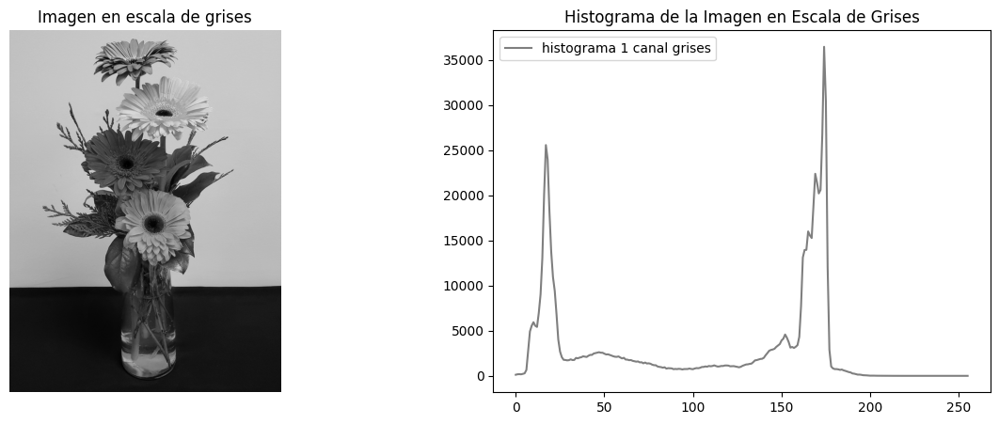

In [ ]:
imagen_gris=convertir_a_gris(imagen_rgb.copy())
hist_gris,binds_gris=np.histogram(imagen_gris.flatten(),256,[0,256])
fig, axs = plt.subplots(1, 2, figsize=(15,5))
axs[0].imshow(imagen_gris,cmap='gray')
axs[0].set_title("Imagen en escala de grises")
axs[0].axis('off')
axs[1].plot(binds_gris[:-1], hist_gris, color='black', label='histograma 1 canal grises', alpha=0.5)
axs[1].legend()  # Muestra la leyenda para identificar cada histograma
axs[1].set_title("Histograma de la Imagen en Escala de Grises")
plt.show()

##Busqueda e impresion del rectangulo

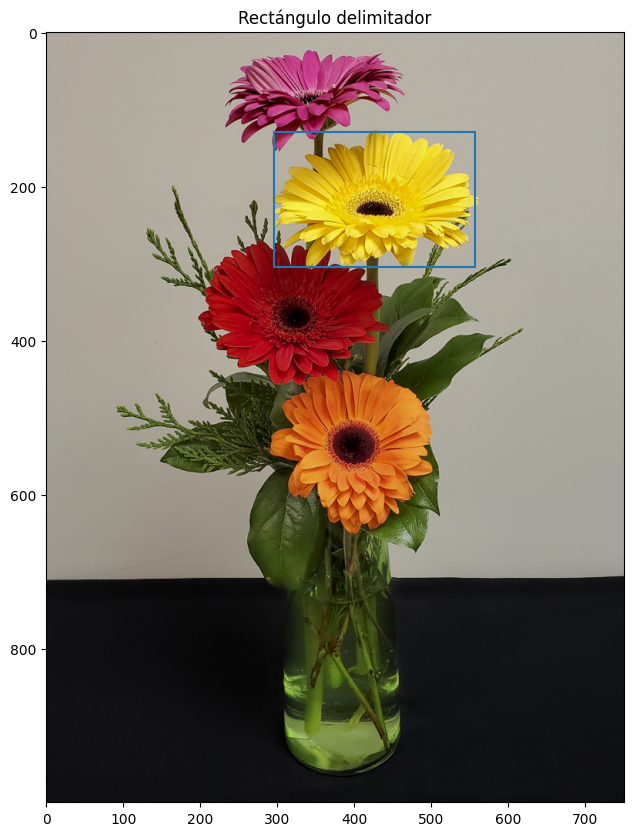

In [ ]:
# Búsqueda de coordenadas del rectángulo
i_min = 10000
i_max = 0
j_min = 10000
j_max = 0
for i in range(N):
    for j in range(M):
        if limpia[i,j]>0:
            if i<i_min: i_min = i
            if i>i_max: i_max = i
            if j<j_min: j_min = j
            if j>j_max: j_max = j
# Dibujo del rectángulo
y = [i_min,i_min,i_max,i_max,i_min]
x = [j_min,j_max,j_max,j_min,j_min]
plt.figure(figsize=(10, 10))
plt.imshow(imagen_rgb)
plt.plot(x,y)
plt.title('Rectángulo delimitador')
plt.show()

##Deteccion e impresion de bordes

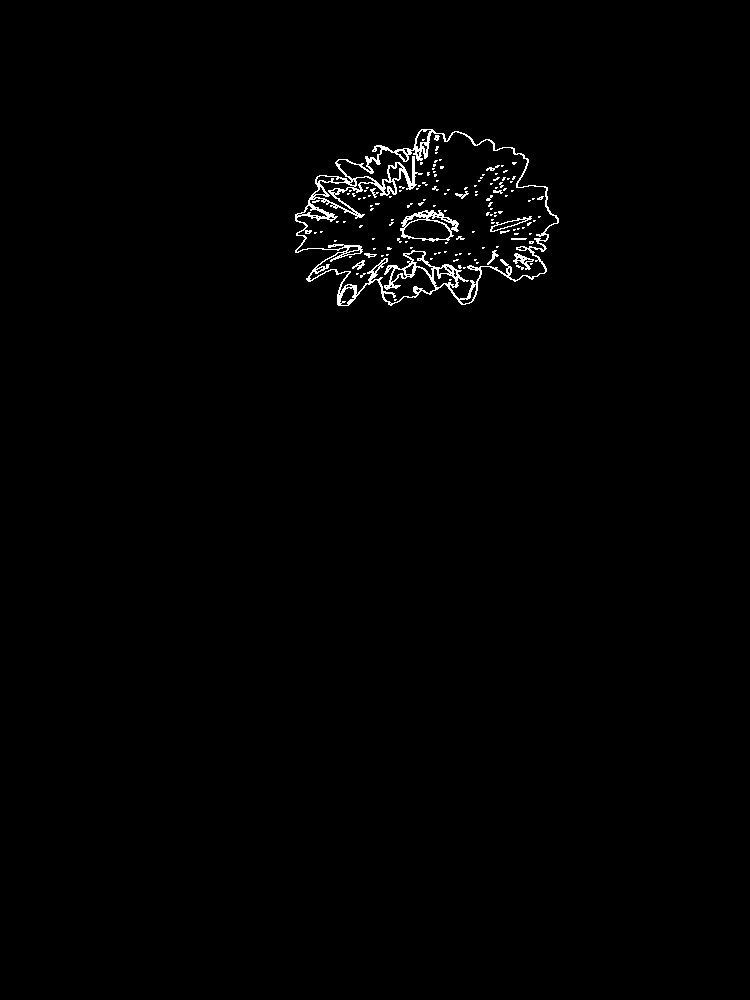

In [ ]:
# Detección de bordes
borde = np.zeros((N,M),np.uint8)
# Bordes horizontales
for i in range(N):
    for j in range(1,M):
        if limpia[i,j]!=limpia[i,j-1]:
            borde[i,j] = 1
            borde[i,j-1] = 1
# Bordes verticales
for i in range(1,N):
    for j in range(M):
        if limpia[i-1,j]!=limpia[i,j]:
            borde[i,j] = 1
            borde[i,j-1] = 1
cv2_imshow(borde*255)

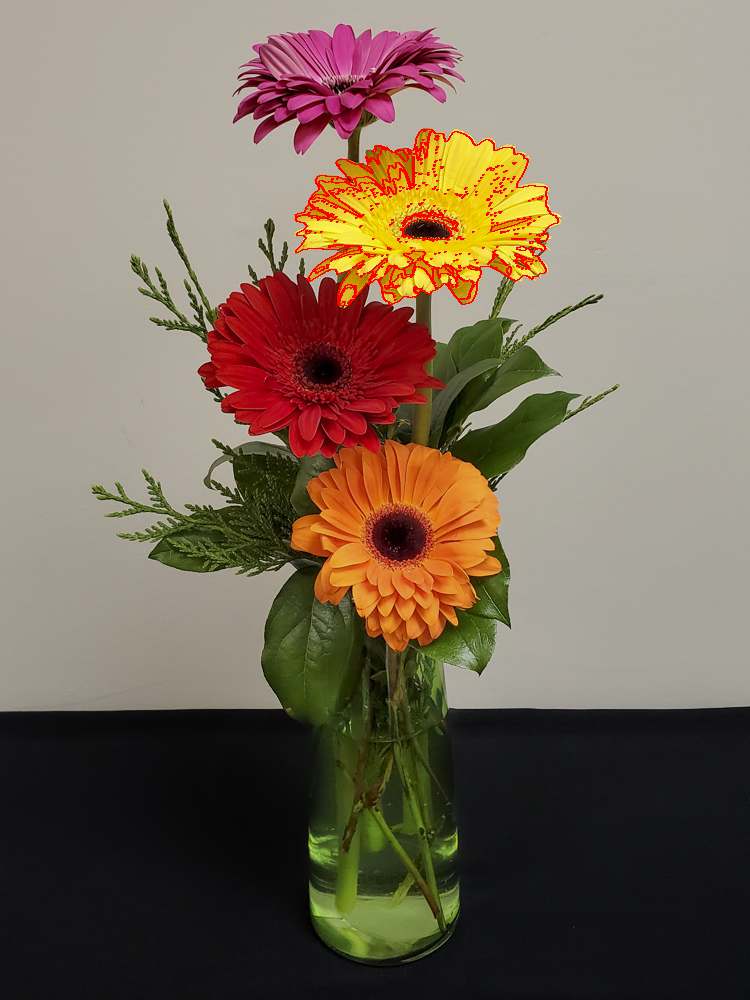

In [ ]:
# Resultado final con bordes en rojo
img_final = imagen.copy()
for i in range(N):
    for j in range(M):
        if borde[i,j]==1:
            img_final[i,j,:] = [0,0,255]
cv2_imshow(img_final)

**Observaciones**

Elegir el color amarillo dificulta la seleccion por color al intervenir 2 canales en su composicion. El fondo de color gris tambien dificultó la segmentacion. Utilizar mas de una condicion por canal es necesario en caso de colores como el amarillo o el naranja compuestos principalmente por 2 canales